In [1]:
from __future__ import print_function, division
import os

from IPython import display
import sys
import importlib

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import math

import matplotlib as mpl
from matplotlib import rcParams
from matplotlib.colors import Normalize
import matplotlib.cm as cm
from matplotlib.colors import LogNorm
from matplotlib import ticker
from matplotlib import colors

rcParams.update({'figure.autolayout': True})
plt.rc('font', family='serif')

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'png')
plt.rcParams['savefig.dpi'] = 75

plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = 10, 6
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['font.size'] = 16
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['lines.markersize'] = 8
plt.rcParams['legend.fontsize'] = 14
mpl.rc('axes',edgecolor='k')
plt.rcParams['xtick.color'] = 'k'
plt.rcParams['ytick.color'] = 'k'

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

plt.rcParams['text.usetex'] = True

/tmp/ipykernel_2329845/928927552.py:25: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('pdf', 'png')


In [2]:
import sys
sys.path.append("./gce-gp/")

from utils import ed_fcts_amarel as ef
from utils import create_mask as cm
from utils import ed_plotting as eplt

/home/mb1403/.conda/envs/jax/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [93]:
from astropy.io import fits
import astropy.units as u
import astropy
import healpy as hp

In [4]:
# load GPU
gpu_id = '2'
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['CUDA_VISIBLE_DEVICES'] = gpu_id

from models.poissonian_gp import EbinPoissonModel

In [5]:
ebinmodel = EbinPoissonModel(
        # important parameters
        is_gp = False,
        data_file = 'fermi_data_sum',

        # default parameters
        nfw_gamma = 1.,
        blg_names = [ef.gen_blg_name_(i)[0] for i in range(5)],
        dif_names = ['gceNNo'],
        )

nside = ebinmodel.nside
ebin = ie = ebinmodel.ebin
data = ebinmodel.counts[ie]
mask_p = ebinmodel.mask_roi_arr[ie]

In [7]:
theta_list,phi_list = hp.pix2ang(nside, range(hp.nside2npix(nside)))
phi_list[phi_list>np.pi] = phi_list[phi_list>np.pi]-2*np.pi
theta_list = theta_list-np.pi/2

In [174]:
#xsize = int(np.sqrt(hp.nside2npix(nside)))+1
#ysize = int(xsize)

xsize = 800
ysize = int(xsize/2)
theta = np.linspace(np.pi, 0, ysize)
phi   = np.linspace(-np.pi, np.pi, xsize)
longitude = np.radians(np.linspace(-180, 180, xsize))
longitude = longitude[::-1]
latitude = np.radians(np.linspace(-90, 90, ysize))
# project the map to a rectangular matrix xsize x ysize
PHI, THETA = np.meshgrid(phi, theta)

In [175]:
xsize

800

In [176]:
grid_pix = hp.ang2pix(nside, THETA, PHI)
grid_map = data[grid_pix]

In [177]:
vmax = 4.5

/tmp/ipykernel_2329845/1722304269.py:9: RuntimeWarning: divide by zero encountered in log10
  ret = ax.pcolormesh(longitude, latitude, np.log10(grid_map),cmap='viridis',


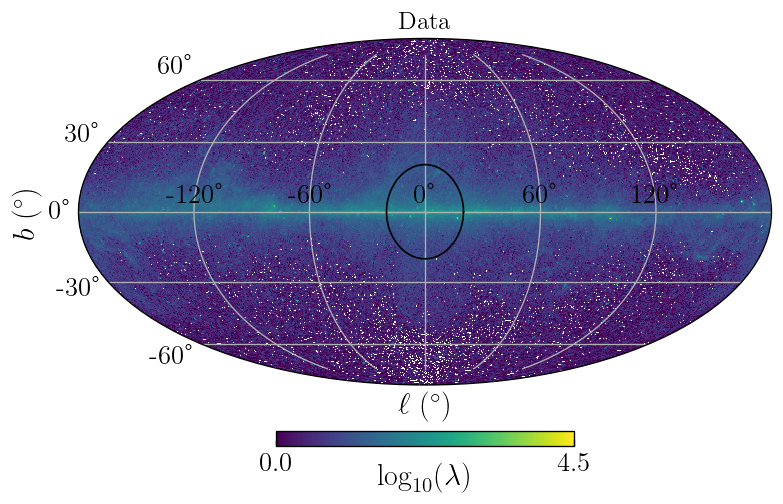

In [178]:
fig = plt.figure(figsize=(8, 5), dpi= 120)
ax = fig.add_subplot(111,projection='mollweide')

ax.set_title('Data')
t = np.linspace(0, 2 * np.pi, 100)
l_list = 20./180*np.pi * np.cos(t)
b_list = 20./180*np.pi * np.sin(t)

ret = ax.pcolormesh(longitude, latitude, np.log10(grid_map),cmap='viridis',
              vmin=0,vmax=vmax)
ax.plot(l_list,b_list, color="k", ls = "-", lw = 1.)
ax.set_xlabel('$\ell~(^\circ)$')
ax.set_ylabel('$b~(^\circ)$')
ax.tick_params(axis='x', colors='k')
ax.set_longitude_grid(60)
ax.set_latitude_grid(30)
ax.grid()

cb = fig.colorbar(ret, orientation='horizontal', shrink=.4, pad=0.10, ticks=[0, vmax])
cb.ax.xaxis.set_label_text(r'$\log_{10}(\lambda)$')
cb.ax.xaxis.labelpad = -8

plt.savefig('figures/fig_allsky_data.pdf',format='pdf',bbox_inches='tight')

In [151]:
data.shape

(196608,)

In [153]:
hp.ang2pix(nside, np.pi/2, 0)

97536

In [168]:
theta_inner_roi_mask = theta[np.abs(theta-np.pi/2)<20/180*np.pi]
phi_inner_roi_mask = phi[np.abs(phi)<20/180*np.pi]

longitude_inner_roi_mask = np.radians(np.linspace(-20, 20, len(theta_inner_roi_mask) ))
longitude_inner_roi_mask = longitude_inner_roi_mask[::-1]
latitude_inner_roi_mask = np.radians(np.linspace(-20, 20, 50))

PHI_inner_roi_mask, THETA_inner_roi_mask = np.meshgrid(phi_inner_roi_mask, theta_inner_roi_mask)

In [169]:
PHI_inner_roi_mask.shape

(98, 50)

In [170]:
grid_pix_inner_roi_mask = hp.ang2pix(nside, THETA_inner_roi_mask, PHI_inner_roi_mask)
grid_map_inner_roi_mask = data[grid_pix_inner_roi_mask]

In [171]:
longitude_inner_roi_mask.shape

(98,)

/tmp/ipykernel_2329845/1629975687.py:4: RuntimeWarning: divide by zero encountered in log10
  ret = ax.pcolormesh(latitude_inner_roi_mask*180/np.pi, longitude_inner_roi_mask*180/np.pi, np.log10(grid_map_inner_roi_mask),cmap='viridis',


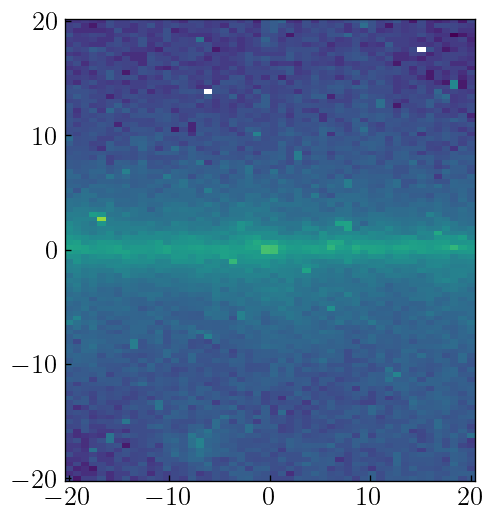

In [172]:
fig = plt.figure(figsize=(15, 5), dpi= 120)
ax = fig.add_subplot(131)

ret = ax.pcolormesh(latitude_inner_roi_mask*180/np.pi, longitude_inner_roi_mask*180/np.pi, np.log10(grid_map_inner_roi_mask),cmap='viridis',
              vmin=0,vmax=vmax)